# Рынок заведений общественного питания Москвы

**Цель: найти подходящее место в Москве для открытия нового заведения общественного питания** 

Описание проекта

Инвесторы из фонда «SUTMM» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

`moscow_places.csv` - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных**

Файл `moscow_places.csv`:

- `name` — название заведения;
- `address` — адрес заведения;

- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

- `hours` — информация о днях и часах работы;

- `lat` — широта географической точки, в которой находится заведение;

- `lng` — долгота географической точки, в которой находится заведение;

- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
 - «Средний счёт: 1000–1500 ₽»;
 - «Цена чашки капучино: 130–220 ₽»;
 - «Цена бокала пива: 400–600 ₽». И так далее;

- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное `0` или `1`, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);

- `district` — административный район, в котором находится заведение, например Центральный административный округ;

- `seats` — количество посадочных мест.

# Шаг 1. Загрузка данных и изучение общей информации

In [86]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import warnings
warnings.filterwarnings('ignore')
from jupyterthemes import get_themes
import jupyterthemes as jt
from jupyterthemes.stylefx import set_nb_theme
set_nb_theme('chesterish')

In [3]:
# все числа типа float отображаются в формате .хх (два знака после запятой)
pd.options.display.float_format = '{:.2f}'.format 

In [4]:
df = pd.read_csv('moscow_places.csv') # чтение файла с данными и сохранение в df

In [5]:
df.head(5) # выводим первые 5 строк

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


Названия столбцов соответствует snake_case - оставлеяем без изменений.

In [6]:
df.info() # получение общей информации о данных в датфрейме df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Все данные имеют соответствущий тип данных - изменять ничего не требуется, за исключением столбца `chain`.

In [7]:
df['chain'].unique()

array([0, 1], dtype=int64)

In [8]:
df['chain'] = df['chain'].astype(bool)

Вывод: данные прочитаны, названия столбцов указаны корректно, все данные имеют соответствущий тип данных. Переходим к предобработке датасета.

# Шаг 2. Предобработка данных

**Проверим столбцы на наличие дубликатов.**

In [9]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [10]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [11]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

В столбцах `category`, `pirice` и `district` все значения уникальные - идём дальше.

В 6 столбцах (`hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`) есть пропуски. Оставляем как есть, т.к. чтобы заполнить пропуски значениями, необходимо проверять каждое заведение и вносить данные вручную.

Посмотрим сколько уникальных заведений в датасете: 

In [12]:
uniq_places = df['name'].nunique()
uniq_places
print(f'В датасете представлено всего уникальных заведений: {uniq_places}')

В датасете представлено всего уникальных заведений: 5614


Займемся поиском дубликатов.

In [13]:
df.duplicated().sum()

0

Повторяющихся значений нет.

Обработаем неявные дубликаты в столбце `name`.

In [14]:
df['name'] = df['name'].str.lower()
df['name'] = df['name'].str.replace('ё', 'е') 
df['name'] = df['name'].str.replace('[!@#$%^&*()-."]',' ')

Всего уникальных значений после обработки:

In [15]:
uniq_places_cut = df['name'].nunique()
print(f'Всего уникальных значений после обработки: {uniq_places_cut}')

Всего уникальных значений после обработки: 5486


Посчитаем сколько неявных дубликатов удалось убрать:

In [16]:
diff = uniq_places - uniq_places_cut
diff

128

In [17]:
diff_percentage = diff / uniq_places * 100
print(round(diff_percentage, 1), '%')

2.3 %


После удаления неявных дубликатов заведений стало 5486, т.е. количество заведение уменьшилось на 2,3%. Не очень много, но зато наше исследование стало чуточку точнее.

Посмотрим наличие дубликатов по сочетанию адреса и названия:

In [18]:
df[['name','address']].duplicated().sum()

3

Всего 3 дубликата - удалим их:

In [19]:
df = df.drop_duplicates(subset=['name','address'])

**Создаём столбец "is_24_7" с обозначением, что заведение работает ежедневно и круглосуточно (24/7):**

In [20]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

In [21]:
df.head(5) # Проверка наличия столбца

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,False,NaN,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,False,4.00,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,False,45.00,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,False,NaN,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,True,148.00,False


**Создаём столбец "street" с названиями улиц из столбца с адресом.**

In [22]:
df['street'] = df['address'].str.extract('(,[А-я ]+)')
df['street'] = df['street'].str.extract('([А-я ]+)')

In [23]:
df.head(5) # Проверка наличия столбца

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,False,NaN,False,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,False,4.00,False,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,False,45.00,False,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,False,NaN,False,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,True,148.00,False,Правобережная улица


Вывод: проведена предобработка данных. В целом оставили как есть, т.к. чтобы заполнить пропуски значениями, необходимо проверять каждое заведение и вносить данные вручную. В столбце "name" убрали неявные дубликаты - 64 штуки (1%).

**Смотрим рейтинги:**

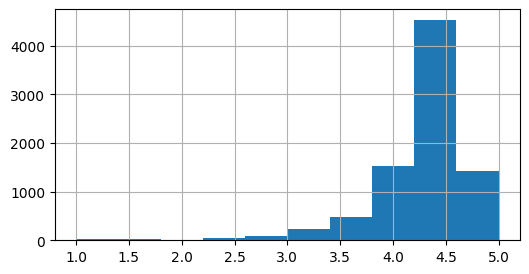

In [24]:
df['rating'].hist(figsize=(6,3));

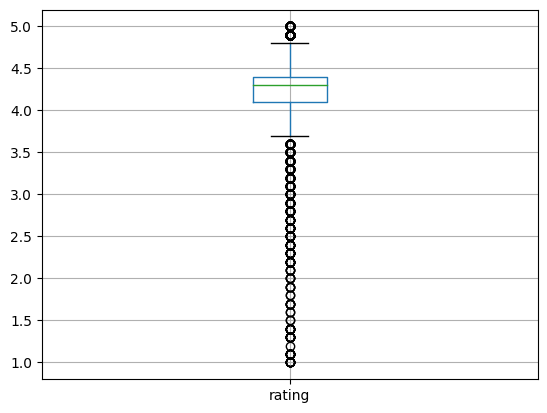

In [25]:
df.boxplot(column=['rating']);

In [26]:
df['rating'].describe()

count   8403.00
mean       4.23
std        0.47
min        1.00
25%        4.10
50%        4.30
75%        4.40
max        5.00
Name: rating, dtype: float64

Всё ок. Оценки в диапазоне от 1 до 5. Медиана - 4.3.

**Смотрим средний чек.**

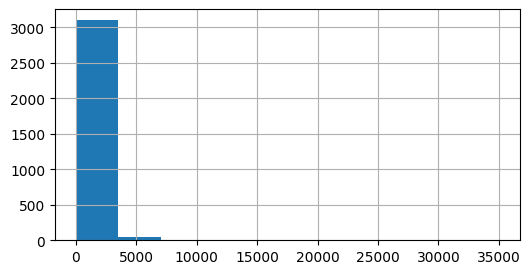

In [27]:
df['middle_avg_bill'].hist(figsize=(6,3));

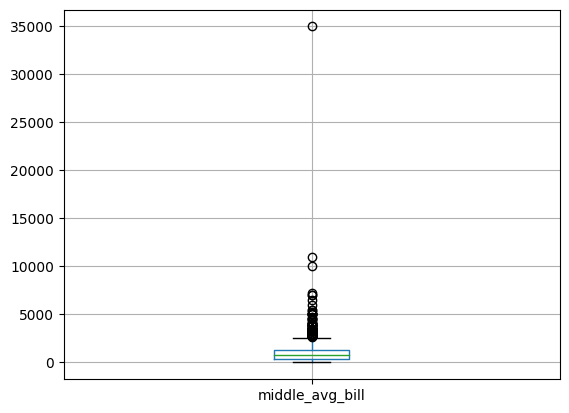

In [28]:
df.boxplot(column=['middle_avg_bill']);

Явно есть выброс на 35 тыс. Посмотрим его.

In [29]:
df.query('middle_avg_bill > 15000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.66,37.65,4.10,высокие,Средний счёт:20000–50000 ₽,35000.00,NaN,False,100.00,True,Каширское шоссе


Нашел это кафе - https://yandex.ru/maps/-/CCUbaRTEKA. Сайта нет, посмотреть меню нет возможности. Но осмелюсь предположить, что здесь явная ошибка, т.к. кафе при больнице вряд ли будет со средним чеком 20000-50000 руб. Удалим аномальное значение из датасета.

In [30]:
df = df.query('middle_avg_bill != 35000')

**Смотрим цены на капучино.**

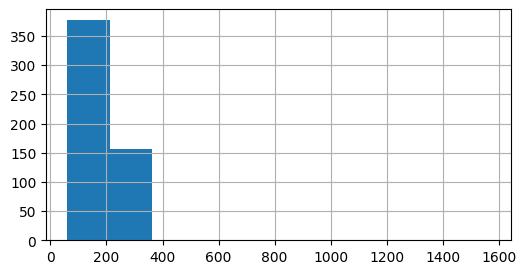

In [31]:
df['middle_coffee_cup'].hist(figsize=(6,3));

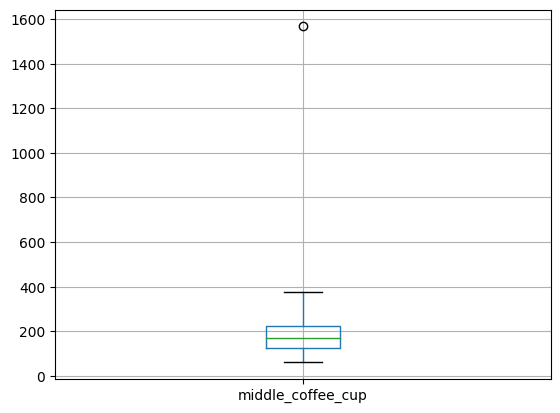

In [32]:
df.boxplot(column=['middle_coffee_cup']);

In [33]:
df.query('middle_coffee_cup > 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7,street
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.00,True,48.00,False,Большая Сем


Нашел это кафе - https://yandex.ru/maps/-/CCUbaVTZgC. Капучино стоит 170 руб. - https://shoko.ru/.
Удалим аномалию.

In [34]:
df = df.query('middle_coffee_cup != 1568.00')

**Осталось проверить посадочные места.**

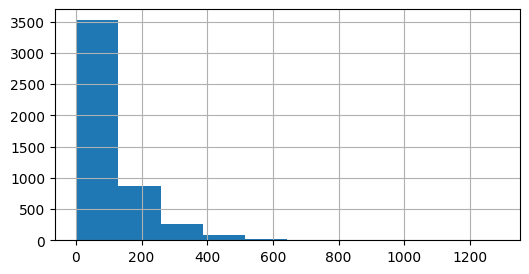

In [35]:
df['seats'].hist(figsize=(6,3));

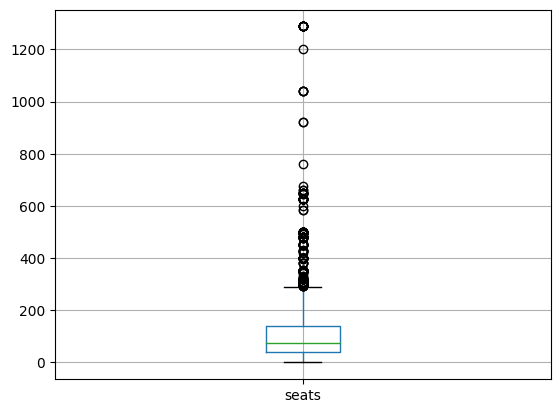

In [36]:
df.boxplot(column=['seats']);

Аномальных выбросов нет. Оставляем как есть.

# Шаг 3. Анализ данных

**Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.**

In [37]:
category_dist = df.groupby('category')['name'].count().sort_values(ascending=False).to_frame()
category_dist

,name
category,
кафе,2377
ресторан,2041
кофейня,1412
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


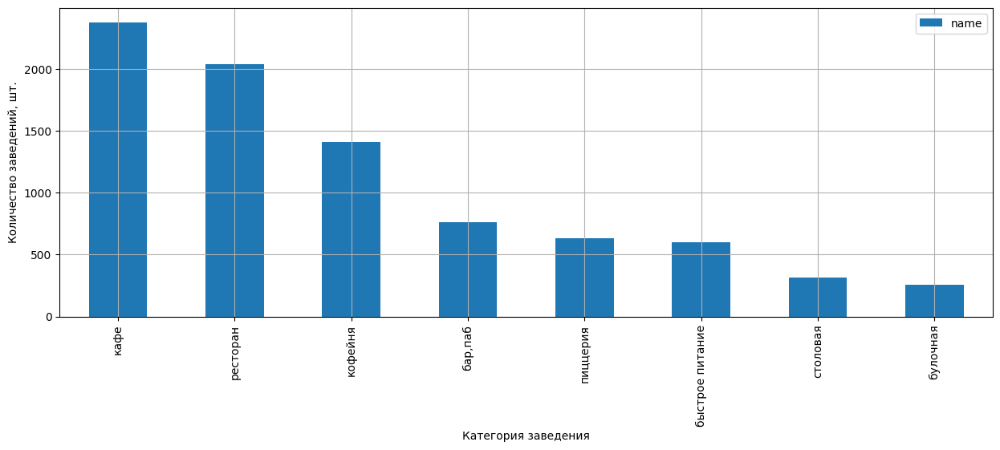

In [38]:
category_dist.plot.bar(grid=True, figsize=(15,5));
plt.xlabel('Категория заведения');
plt.ylabel('Количество заведений, шт.');

Вывод: в датасете представлены следующие категории заведений: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная. Больше всего заведений представлено в категории "кафе" и "ресторан" - более 2000 заведений в каждой категории, за ними "кофейня" - почти 1,5 тыс. Все остальные категории не превышают тысячи заведений (в каждой категории).

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.**

In [39]:
seats_per_category = df.groupby('category')['seats'].mean().sort_values(ascending=False).to_frame()
seats_per_category

,seats
category,
"бар,паб",124.48
ресторан,121.91
кофейня,111.28
столовая,99.75
быстрое питание,98.89
кафе,97.37
пиццерия,94.50
булочная,89.39


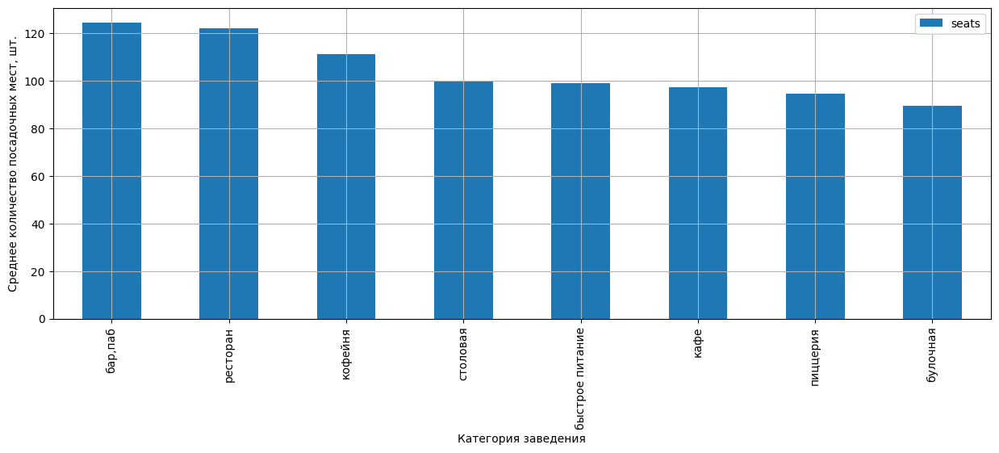

In [40]:
seats_per_category.plot.bar(grid=True, figsize=(15,5));
plt.xlabel('Категория заведения');
plt.ylabel('Среднее количество посадочных мест, шт.');

In [41]:
df['seats'].describe()

count   4790.00
mean     108.38
std      122.86
min        0.00
25%       40.00
50%       75.00
75%      140.00
max     1288.00
Name: seats, dtype: float64

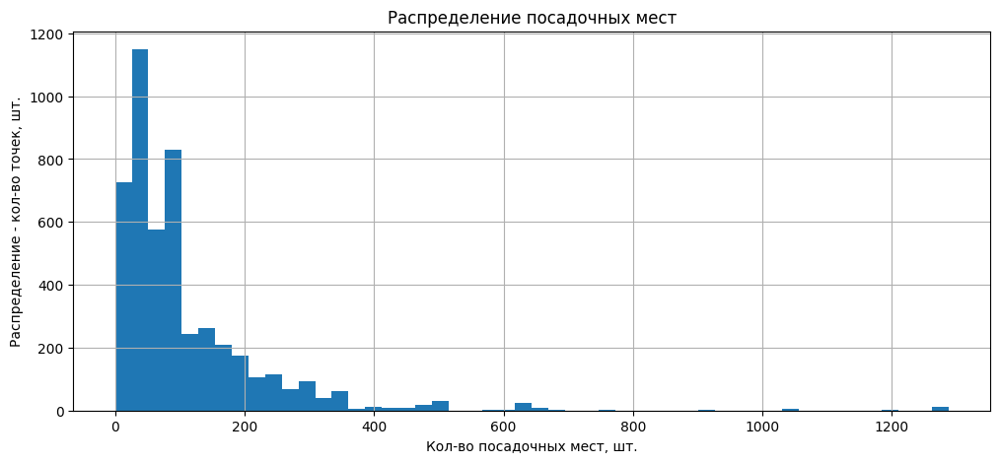

In [42]:
df['seats'].hist(figsize=(12,5), label='Посадочных мест', bins=50, range=(0,1288))
plt.xlabel('Кол-во посадочных мест, шт.')
plt.ylabel('Распределение - кол-во точек, шт.')
plt.title('Распределение посадочных мест');

Вывод: в среднем больше вcего посадочных мест в барах и ресторанах - более 120 в каждой категории. Меньше всего в булочных - менее 90. Медианное значение посадочных мест для всех заведений - 75, общее среднее - 108.

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [43]:
chain_marker = ['Несетевое', 'Сетевое']
fig = go.Figure(data=[go.Pie(labels=chain_marker, values=df['chain'].value_counts(), \
                             title='Соотношение сетевых и несетевых заведений по количеству')])
fig.show()

Вывод: несетевых заведений гораздо больше, чем сетевых: 62% vs 38%.

**Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.**

In [44]:
df['chain_category'] = df['chain']
df['chain_category'] = df['chain_category'].replace({False: 'Несетевое', True: 'Сетевое'})
df_new = df.groupby(['category', 'chain_category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)
 
percentage_df = df.groupby(['category', 'chain_category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0: 'percentage'})

percentage_df = percentage_df.sort_values('percentage')

In [45]:
fig = px.bar(percentage_df,\
             x='category',\
             y='percentage',\
             color='chain_category',\
             title='Распределение количества заведений по районам',\
             width=1000,
             height=700)
 
fig.update_layout(
    title='Распределение сетевых и несетевых заведений по категориям (в процентах)',
    xaxis_title="Категория заведения",
    yaxis_title="Количество",
    xaxis=dict(
        tickmode='array',
        tickvals=percentage_df['category'],
        ticktext=percentage_df['category']
    ),
    legend_title=''
)
fig.show()

Вывод: чаще всего сетевыми заведениями являются булочные: 62%. Затем идут кофейни и пиццерии: больше 50%. Все остальные менее 50%.

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.**

In [46]:
df_chain = df.query('chain == 1')

In [47]:
top_chain_by_name = df_chain.groupby('name').size().reset_index(name='count').sort_values(by='count', ascending=False).head(15)
top_chain_by_name

,name,count
728,шоколадница,119
335,домино'с пицца,76
331,додо пицца,74
741,яндекс лавка,72
147,one price coffee,71
58,cofix,65
168,prime,50
664,хинкальная,44
410,кофепорт,42
419,кулинарная лавка братьев караваевых,39


In [48]:
# строим столбчатую диаграмму 
fig = px.bar(top_chain_by_name.sort_values(by='count', ascending=False), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Название сети',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

In [49]:
top_chain_by_category = df_chain.groupby('category').size().reset_index(name='count').sort_values(by='count', ascending=False).head(15)
top_chain_by_category

,category,count
3,кафе,779
6,ресторан,729
4,кофейня,719
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",168
1,булочная,157
7,столовая,88


In [50]:
# строим столбчатую диаграмму 
fig = px.bar(top_chain_by_category.sort_values(by='count', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Категория заведения',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

In [51]:
top_chain_by_district = df_chain.groupby('district').size().reset_index(name='count').sort_values(by='count', ascending=False).head(15)
top_chain_by_district 

,district,count
5,Центральный административный округ,875
1,Западный административный округ,376
2,Северный административный округ,346
3,Северо-Восточный административный округ,333
8,Южный административный округ,312
7,Юго-Западный административный округ,302
0,Восточный административный округ,282
6,Юго-Восточный административный округ,220
4,Северо-Западный административный округ,156


In [52]:
# строим столбчатую диаграмму 
fig = px.bar(top_chain_by_district.sort_values(by='count', ascending=False), # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Административный округ',
                   yaxis_title='Количество заведений')
fig.show() # выводим график

Вывод: топ-15 сетевых заведений нашли. С большим отрывом лидирует Шоколадница, у остальных значительно меньше заведений. Лично я знаю только 7 сетей из топ-15 (живу в Санкт-Петербурге). Объединяющего признака не вижу: в топе и кофейни и пиццерии и рестораны. Топ-3 категории это кафе, ресторан и кофейня - более 700 заведений в каждой категории, остальные категории значительно меньше - более, чем в 2 раза. Больше всего сетевых заведений расположены в ЦАО - 875 заведений. В остальных районах количество сетевых заведений более, чем в 2 раза.

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [54]:
total_qty = len(df['name'])
print(f'Общее количество заведений: {total_qty}')

Общее количество заведений: 8401


Общее количество заведений по районам

In [55]:
df_rest_by_district = df.pivot_table(index = 'district', values = 'name', 
                            aggfunc = ['count'])
df_rest_by_district.columns = ['Кол-во заведений']
df_rest_by_district.sort_values(by='Кол-во заведений', ascending=False)

,Кол-во заведений
district,
Центральный административный округ,2242
Северный административный округ,899
Южный административный округ,891
Северо-Восточный административный округ,890
Западный административный округ,850
Восточный административный округ,797
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


Общее количество заведений каждой категории по районам

In [56]:
df_new = df.groupby(['district', 'category'])['name'].agg('count')\
                                       .reset_index()\
                                       .sort_values(by='name', ascending=False)
 
percentage_df = df.groupby(['district', 'category'])\
                         .size()\
                         .groupby(level=0)\
                         .apply(lambda x: round(100 * x / float(x.sum()), 2))\
                         .reset_index()\
                         .rename(columns={0: 'percentage'})

In [57]:
fig = px.bar(percentage_df,\
             x='district',\
             y='percentage',\
             color='category',\
             title='Распределение количества заведений по районам',\
             width=1000,
             height=1200)  # text_auto='',
 
fig.update_layout(
    title='Типы заведений по районам (в процентах)',
    xaxis_title="Район",
    yaxis_title="Количество",
    xaxis=dict(
        tickmode='array',
        tickvals=percentage_df['district'],
        ticktext=percentage_df['district']
    ),
    legend_title=''
)
fig.show()

Вывод: в датасете присутствуют 9 из 12 округов Москвы. В ЦАО больше, чем в остальных расположено баров/пабов и ресторанов, чем в остальных округах. Больше всего кафе расположено в ЮВАО.

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

Вариант 1

In [58]:
avg_rating_by_category = df.groupby('category', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
avg_rating_by_category

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


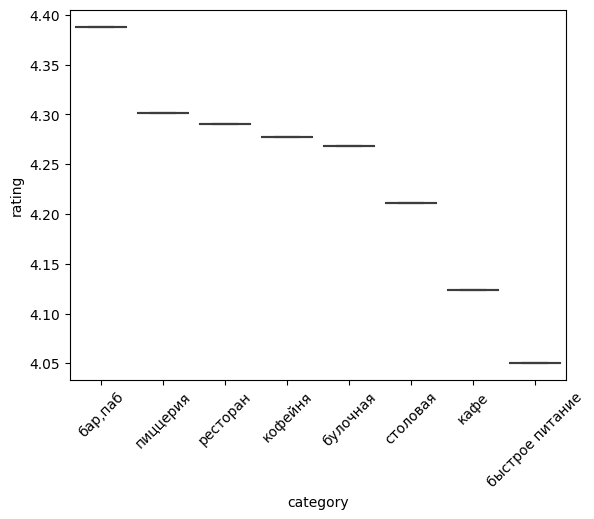

In [59]:
sns.boxplot(x='category', y='rating', data=avg_rating_by_category) 
plt.xticks(rotation=45);

Вариант 2

In [60]:
fig = px.box(df, x='category', y='rating')
fig.show()

Вывод: средний рейтинг по всем категория - выше 4. Самый высокий в барах/пабах - 4.39, самый низкий в заведениях быстрого питания - 4.05. Разница между самым высоким и низким всего лишь 8%.

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).**

In [61]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [62]:
import geojson
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
with open(state_geo, encoding='utf-8') as f:
    gj = geojson.load(f)

In [63]:
# импортируем карту и хороплет
from folium import Map, Choropleth
import json

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=gj,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Вывод: на хороплете хорошо видно как сильно выделяется центральный район по сравнению с остальными - заведения с наибольшим рейтингом находятся в этом округе.

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [64]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Вывод: на карте хорошо видно, что в центре самая болшая концентрация заведений общественного питания.

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [65]:
df_filtered = df.query('street != " "') # Убираем пропуски в улицах - были улицы с одним пробелом 
rest_count = df_filtered.groupby('street')['category'].size().reset_index(name='count').sort_values(by='count', ascending=False).head(15)
rest_count

,street,count
915,проспект Мира,183
607,Профсоюзная улица,122
912,проспект Вернадского,108
361,Ленинский проспект,107
359,Ленинградский проспект,95
210,Дмитровское шоссе,88
136,Варшавское шоссе,76
291,Каширское шоссе,76
360,Ленинградское шоссе,70
386,МКАД,65


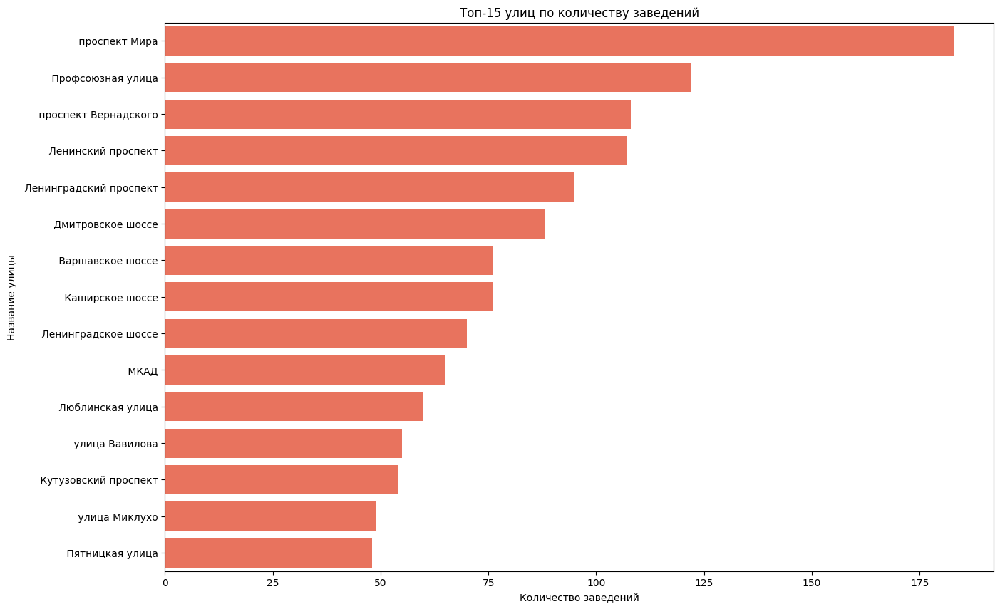

In [66]:
plt.figure(figsize=(15,10))
plt.title('Топ-15 улиц по количеству заведений')
sns.barplot(x='count', y='street', data=rest_count, color='#FF6347').set(ylabel='Название улицы', xlabel='Количество заведений')

plt.show()

Вывод: наибольшее количество точек общественного питания расположено на проспекте Мира. 

**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [67]:
print('Число улиц с одним объектом общественного питания =', sum(df.groupby('street')['name'].count().values==1))

Число улиц с одним объектом общественного питания = 362


In [68]:
single_place_on_street = df.groupby('street')['name'].count().values == 1
single_place_on_street.sum()

362

In [69]:
# 362 улицы с одним кафе - остортируем по возрастанию и возьмем последние 362 значения (единицы)
df_new_single_rest_on_street = df_filtered.groupby(['street', 'name', 'rating', 'category','lat', 'lng'])\
        .size().reset_index(name='count').sort_values(by='count', ascending=False).tail(362)

In [70]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_new_single_rest_on_street.apply(create_clusters, axis=1)

# выводим карту
m

Вывод: число улиц с одним объектом общественного питания - 362. Большинство улицы с одним заведением находятся в центре Москвы. Очень мало на окраинах, но есть исключение - Юго-Восточный административный округ.

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [71]:
df['middle_avg_bill'].describe()

count    3148.00
mean      947.24
std       807.17
min         0.00
25%       375.00
50%       750.00
75%      1250.00
max     11000.00
Name: middle_avg_bill, dtype: float64

In [72]:
median_rating_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending=False)
median_rating_df

,district,middle_avg_bill
1,Западный административный округ,1000.00
5,Центральный административный округ,1000.00
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [73]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=gj,
    data=median_rating_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Медианное значение чеков заведений по районам',
).add_to(m)

# выводим карту
m

Вывод: самые высокие цены в ЦАО и ЗАО. В остальных округах значительно меньше, но в целом в западной части Москвы цены выше, чем в восточной.

**Общий вывод по шагу 3:**

1) В датасете представлены следующие категории заведений: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная. Больше всего заведений представлено в категории "кафе" и "ресторан" - более 2000 заведений в каждой категории, за ними "кофейня" - почти 1,5 тыс. Все остальные категории не превышают тысячи заведений (в каждой категории).

2) В среднем больше вcего посадочных мест в барах и ресторанах - более 120 в каждой категории. Меньше всего в булочных - менее 90. Медианное значение посадочных мест для всех заведений - 75, общее среднее - 108.

3) Несетевых заведений гораздо больше, чем сетевых: 62% vs 38%.

4) Чаще всего сетевыми заведениями являются булочные: 62% от всех заведений. Затем идут кофейни и пиццерии: больше 50%. Все остальные менее 50%.

5) Топ-15 сетевых заведений нашли. С большим отрывом лидирует Шоколадница, у остальных значительно меньше заведений. Лично я знаю только 7 сетей из топ-15 (живу в Санкт-Петербурге). Объединяющего признака не вижу: в топе и кофейни и пиццерии и рестораны. Топ-3 категории это кафе, ресторан и кофейня - более 700 заведений в каждой категории, остальные категории значительно меньше - более, чем в 2 раза. Больше всего сетевых заведений расположены в ЦАО - 875 заведений. В остальных районах количество сетевых заведений более, чем в 2 раза.

6) В датасете присутствуют 9 из 12 округов Москвы. В ЦАО больше, чем в остальных расположено баров/пабов и ресторанов, чем в остальных округах. Больше всего кафе расположено в ЮВАО.

7) Средний рейтинг по всем категория - выше 4. Самый высокий в барах/пабах - 4.39, самый низкий в заведениях быстрого питания - 4.05. Разница между самым высоким и низким всего лишь 8%.

8) На хороплете хорошо видно как сильно выделяется центральный район по сравнению с остальными - заведения с наибольшим рейтингом находятся в этом округе.

9) На карте хорошо видно, что в центре самая болшая концентрация заведений общественного питания. 

10) Наибольшее количество точек общественного питания расположено на проспекте Мира.

11) Число улиц с одним объектом общественного питания - 362. Большинство улицы с одним заведением находятся в центре Москвы. Очень мало на окраинах, но есть исключение - Юго-Восточный административный округ.

12) Самые высокие цены в ЦАО и ЗАО. В остальных округах значительно меньше, но в целом в западной части Москвы цены выше, чем в восточной.


# Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

- Есть ли круглосуточные кофейни?

- Какие у кофеен рейтинги? Как они распределяются по районам?

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


**Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

In [74]:
df_coffee = df.query('category == "кофейня"')

In [75]:
print('Всего кофеен в датасете:', len(df_coffee['category']))

Всего кофеен в датасете: 1412


In [76]:
df_coffee.groupby('district').size().reset_index(name='count').sort_values(by='count', ascending=False)

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,104
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [77]:
# создаём карту Москвы
m_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_coffee)
# применяем функцию create_clusters() к каждой строке датафрейма
df_coffee.apply(create_clusters, axis=1)
# выводим карту
m_coffee

Вывод: всего кофеен в датасете: 1412. Наибольшее количество кофеен расположено в ЦАО. В целом большие скопления кофеен находятся на севере, западе и юго-западе Москвы. А вот на восточной части Москвы их значительно меньше.

**Есть ли круглосуточные кофейни?**

In [78]:
df_24_7_coffee = df_coffee.query('is_24_7 == True')

In [79]:
print('Всего круглосуточных кофеен в датасете:', len(df_24_7_coffee))

Всего круглосуточных кофеен в датасете: 59


**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [80]:
rating_df_coffee = df_coffee.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
rating_df_coffee

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Вывод: в целом независимо от района средний рейтинг кофеен находится в диапазоне от 4.2 до 4.3. Это означает, что кофе везде хороший.

**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [81]:
df_coffee['middle_coffee_cup'].describe().to_frame()

,middle_coffee_cup
count,520.00
mean,172.38
std,65.77
min,60.00
25%,124.00
50%,169.50
75%,225.00
max,375.00


Посмотрим какие цены на капучино в круглосуточных кофейнях.

In [82]:
df_24_7_coffee['middle_coffee_cup'].describe().to_frame()

,middle_coffee_cup
count,15.00
mean,225.73
std,61.96
min,90.00
25%,199.50
50%,256.00
75%,256.00
max,291.00


Средняя цена выше на 30%, а медианная на 50%!

Посмотрим сколько будет стоить капучино в не круглосуточных кофейнях.

In [83]:
df_coffee_not_24_7 = df_coffee.query('is_24_7 == False')

In [84]:
df_coffee_not_24_7['middle_coffee_cup'].describe().to_frame()

,middle_coffee_cup
count,504.00
mean,170.57
std,65.14
min,60.00
25%,120.00
50%,165.00
75%,221.25
max,375.00


Среднее и медианное значения практически без изменений, значит можно на них полагаться. 

Построим визуализацию цен по округам.


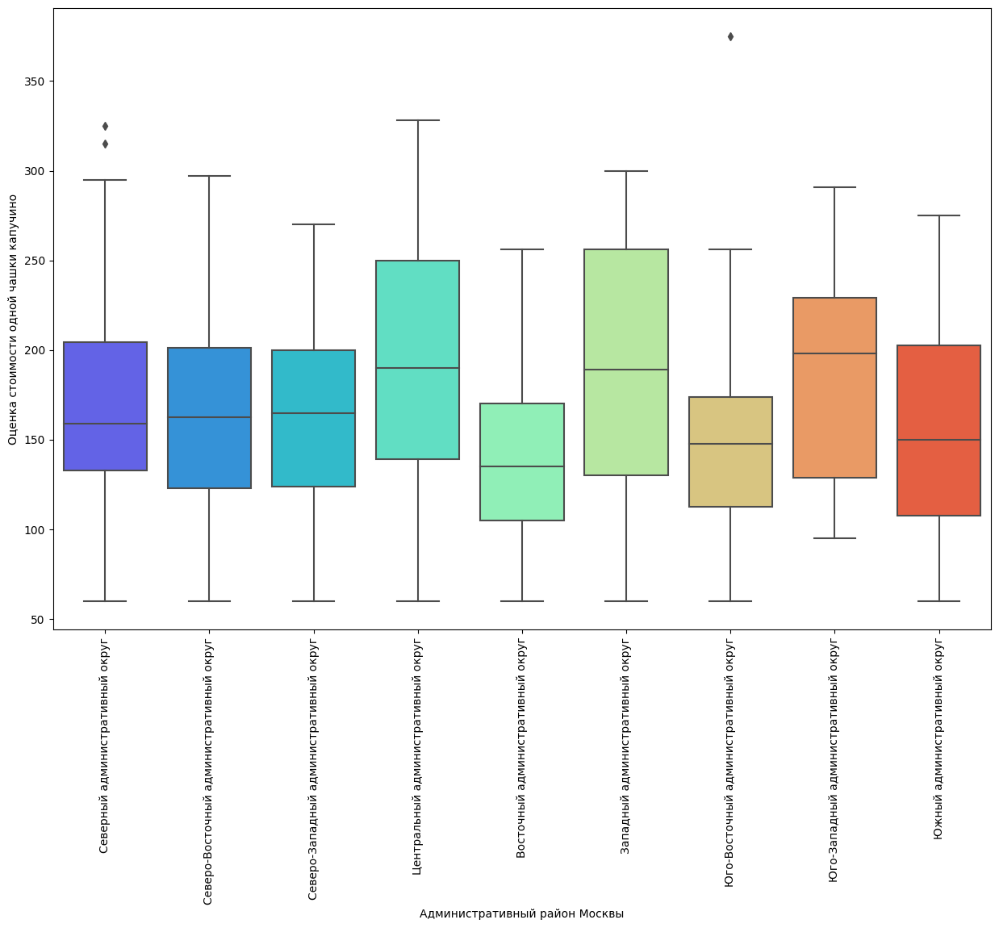

In [85]:
plt.figure(figsize=(15,10))

g = sns.boxplot(x='district', y='middle_coffee_cup', data=df_coffee, palette='rainbow')
g.set_xticklabels(g.get_xticklabels(), rotation=90);
plt.xlabel('Административный район Москвы');
plt.ylabel('Оценка стоимости одной чашки капучино');

Вывод: средняя цена чашки капучино составляет примерно 170 рублей, медианная практически такая же. В целом лучше ориентироваться на медианное значение, но оно отличается от округа к округу: в ЦАО, ЗАО и ЮЗАО медианное в районе 200 руб.

**Общий вывод по шагу 4**

Всего кофеен в датасете: 1413. Из них круглосуточных - 59. Наибольшее количество кофеен расположено в ЦАО. В целом большие скопления кофеен находятся на севере, западе и юго-западе Москвы. А вот на восточной части Москвы их значительно меньше. Независимо от района средний рейтинг кофеен находится в диапазоне от 4.2 до 4.3. Это означает, что кофе везде хороший. Средняя цена чашки капучино составляет примерно 170 рублей, медианная практически такая же. В целом лучше ориентироваться на медианное значение, но оно отличается от округа к округу: в ЦАО, ЗАО и ЮЗАО медианное в районе 200 руб.


Рекомендации по открытию новой кофейни: открывать в центральной или западной части Москвы; нет необходимости делать кофейню круглосуточной, т.к. среднее и мединное значение во всех кофейнях практически одинаковые, а вот расходов на содержание заведеения будет больше; цена на капучно должна быть не выше 170 руб. за кружку. Но для более полного анализа требуется изучить датасет со стоимостью аренды коммерческих помещений, т.к. в зависимости от округа цена будет сильно различаться.


Презентация: https://disk.yandex.ru/i/yRCXJlA9rTiTWg